<a href="https://www.kaggle.com/code/anishsarkar003/two-stream-vs-single-stream-spatiotemporal-net?scriptVersionId=168400365" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Importing Libraries and Loading the Dataset

In [1]:
import pandas as pd
df= pd.read_csv('/kaggle/input/highway-information/info.txt', sep ='\t')

In [2]:
import warnings
warnings.filterwarnings('ignore')


In [3]:
df

,filename,date(yyyymmdd),timestamp,direction,day/night,weather,start_frame,number_of_frames,Unnamed: 8,class,notes
0,cctv052x2004080516x01638,20040805,16.01638,south,day,overcast,2,53,medium,NaN,NaN
1,cctv052x2004080516x01639,20040805,16.01639,south,day,overcast,2,53,medium,NaN,NaN
2,cctv052x2004080516x01640,20040805,16.01640,south,day,overcast,2,48,light,NaN,NaN
3,cctv052x2004080516x01641,20040805,16.01641,south,day,overcast,2,52,medium,NaN,NaN
4,cctv052x2004080516x01642,20040805,16.01642,south,day,overcast,2,51,medium,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
249,cctv052x2004080619x00104,20040806,19.00104,south,day,clear,2,53,light,NaN,NaN
250,cctv052x2004080620x00105,20040806,20.00105,south,day,clear,2,52,light,NaN,NaN
251,cctv052x2004080620x00106,20040806,20.00106,south,day,clear,2,53,light,NaN,NaN
252,cctv052x2004080620x00107,20040806,20.00107,south,day,clear,2,53,light,NaN,NaN


In [4]:
df['number_of_frames'].max()

53

In [5]:
df = df.drop(['date(yyyymmdd)','timestamp','direction','day/night','weather','class','notes'],axis=1)

In [6]:
df = df.rename(columns = {'Unnamed: 8': 'class'})

In [7]:
df.isna().sum()

filename            0
start_frame         0
number_of_frames    0
class               0
dtype: int64

# Processing the video files to get the training data

In [8]:
import cv2
import pandas as pd
import numpy as np

df = df.sample(frac=1)



# Create empty list to store frames and labels
frames_list = []
labels_list = []

height = 224
width = 224
num_channels = 3

# Loop through each row in the CSV file
for index, row in df.iterrows():
    # Set start frame and number of frames for this row
    start_frame = row['start_frame']
    num_frames = 40

    # Open video file
    cap = cv2.VideoCapture('/kaggle/input/highway-traffic-videos-dataset/video/' + row['filename'] + '.avi')

    # Create empty array to store frames
    frames = np.empty((num_frames, height, width, num_channels), dtype=np.uint8)

    # Loop through each frame for this row
    for i in range(num_frames):
        # Set the current frame to the start frame plus i
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame + i)

        # Read the current frame from the video file
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, (height, width))
        # Store the current frame in the frames array
        frames[i] = frame
        

        

    # Release video file
    cap.release()

    

    # Append sequence of frames to list of frames
    frames_list.append(frames)

    # Add label to list of labels according to the class in the CSV file
    label = row['class']
    labels_list.append(label)






[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 5 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing, 0 left
[msmpeg4v1 @ 0x579e8e63ca80] ext header missing,

In [9]:
print(labels_list)

['light', 'heavy', 'heavy', 'light', 'light', 'light', 'medium', 'medium', 'light', 'light', 'light', 'light', 'heavy', 'medium', 'light', 'light', 'medium', 'heavy', 'heavy', 'light', 'medium', 'medium', 'medium', 'medium', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'heavy', 'light', 'light', 'light', 'heavy', 'medium', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'heavy', 'light', 'light', 'heavy', 'medium', 'medium', 'light', 'light', 'heavy', 'light', 'light', 'light', 'light', 'light', 'heavy', 'light', 'medium', 'light', 'light', 'light', 'heavy', 'light', 'medium', 'light', 'light', 'heavy', 'light', 'light', 'light', 'light', 'medium', 'heavy', 'light', 'medium', 'light', 'medium', 'light', 'light', 'medium', 'light', 'light', 'heavy', 'light', 'medium', 'light', 'light', 'light', 'medium', 'light', 'light', 'light', 'light', 'heavy', 'light', 'light', 'light', 'medium', 'medium', 'medium', 'light', 'light', 'light', 'light', 'medi

In [10]:
def num_counts(arr):
    heavy_counts,medium_counts,light_counts = 0,0,0
    for i in arr:
        if i == 'heavy':
            heavy_counts += 1
        elif i == 'medium':
            medium_counts += 1
        else:
            light_counts += 1
    return (heavy_counts,medium_counts,light_counts)

In [11]:
print(num_counts(labels_list))

(44, 45, 165)


# Visualizing the Dataset

In [12]:
pip install tensorflow-docs


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.6/183.6 kB 6.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [13]:
import imageio
from tensorflow_docs.vis import embed


In [14]:
def to_gif(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, duration=25)
  return embed.embed_file('./animation.gif')

In [15]:
for i in frames_list:
    to_gif(i)
    break

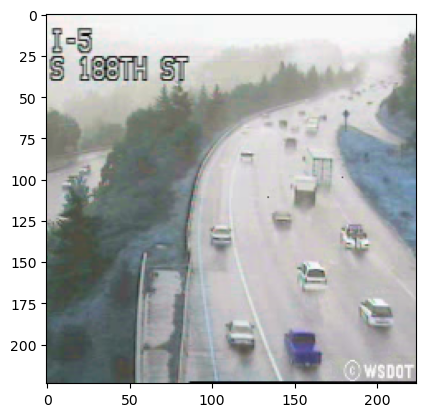

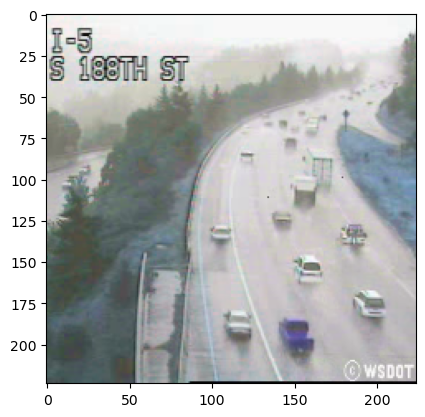

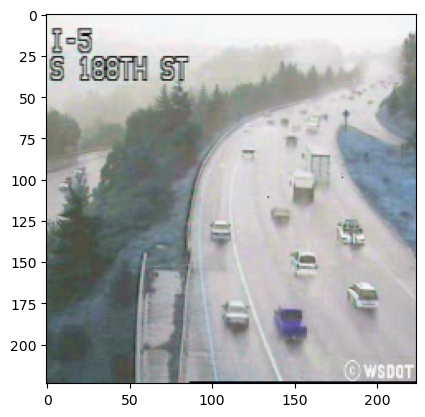

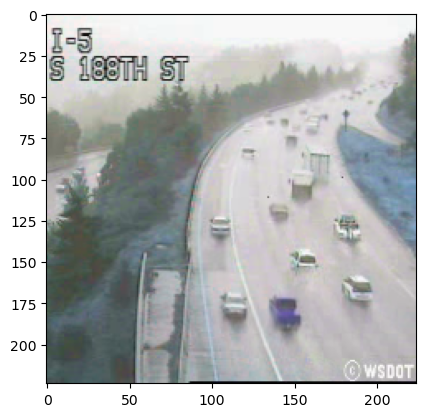

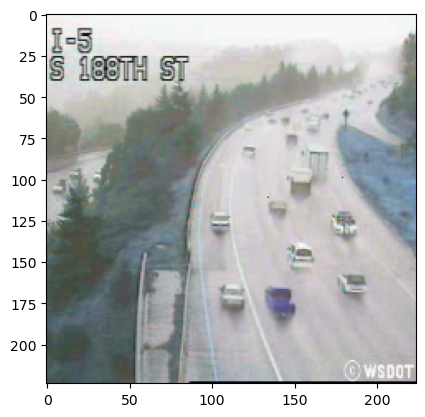

...

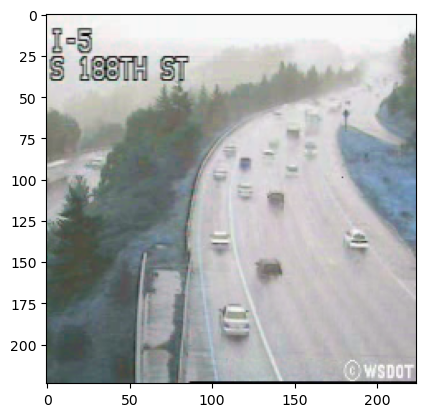

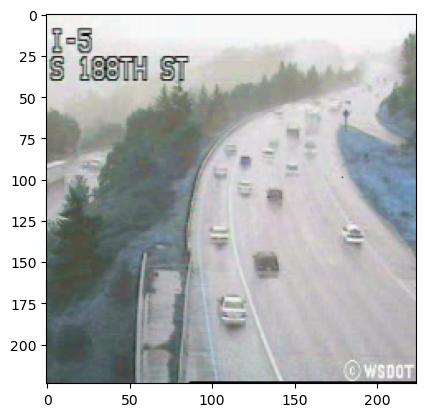

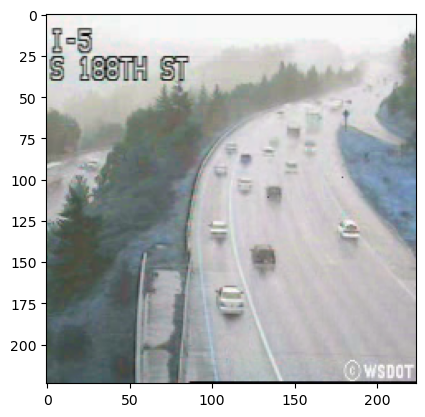

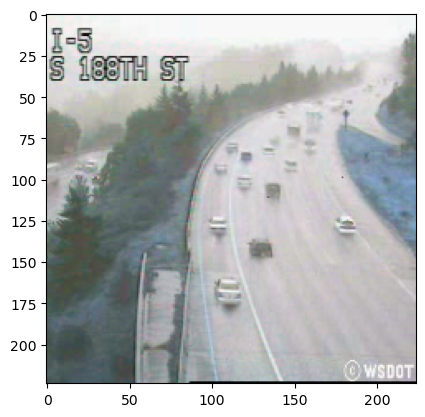

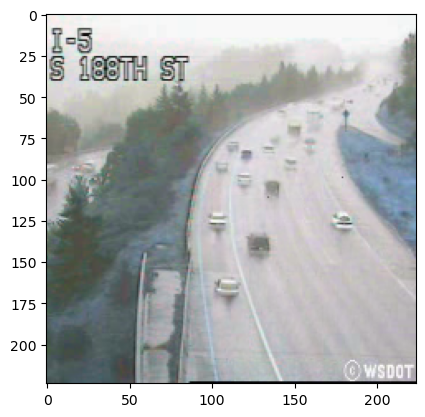

In [16]:
import matplotlib.pyplot as plt

%matplotlib inline
for i in frames_list:
    for j in i:
        plt.imshow(j)
        plt.show()
    break
    
    

# Splitting the Dataset And One Hot Encoding

In [17]:
X = np.stack(frames_list[:int(len(frames_list)*0.7)], axis=0)

In [18]:
print(X.shape)

(177, 40, 224, 224, 3)


In [19]:
# Create a dictionary to map the labels to integers
label_dict = {'light': 0, 
              'medium': 1, 
              'heavy': 2}

# Convert the labels to integers using the dictionary
labels_int = [label_dict[label] for label in labels_list]

# One-hot encode the integer labels using NumPy
labels_onehot = np.eye(3)[labels_int]


In [20]:
num_samples = len(labels_list)
train_size = int(num_samples * 0.7)
train_labels = labels_onehot[:train_size]
test_labels = labels_onehot[train_size:]




In [21]:
print(len(train_labels))

177


In [22]:
print(X.shape)

(177, 40, 224, 224, 3)


# Model Training

In [23]:
import tensorflow as tf
from tensorflow.keras.layers import Input, TimeDistributed, GRU,LSTM ,Dense
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model


input_shape = (40, 224, 224, 3)  # (time_step/num_frames, height, width, num_channels)


base_model = InceptionV3(include_top=False, weights='imagenet', input_shape=(224, 224, 3),pooling='max')


for layer in base_model.layers[:-1]:
    layer.trainable = False


input_layer = Input(shape=input_shape)


frames = TimeDistributed(base_model)(input_layer)


#rnn_layer = LSTM(units=128)(frames)
# or
rnn_layer = GRU(units=32)(frames)

# Add a classification layer
output_layer = Dense(units=3, activation='softmax')(rnn_layer)  # Replace num_classes with the actual number of classes

# Create the model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

87910968/87910968 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 40, 224, 224, 3)  0         
                             ]                                   
                                                                 
 time_distributed (TimeDistr  (None, 40, 2048)         21802784  
 ibuted)                                                         
                                                                 
 gru (GRU)                   (None, 32)                199872    
                                                                 
 dense (Dense)               (None, 3)                 99        
                                                                 
Total params: 22,002,755
Trainable params: 199,971
Non-trainable params: 21,802,784
____________________________________________

In [24]:
X_val = np.stack(frames_list[int(len(frames_list)*0.7):], axis=0)


In [25]:
assert(X_val.shape[0]==test_labels.shape[0])

In [26]:
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint = ModelCheckpoint('weights.hdf5', monitor='val_loss', save_best_only=True)
from tensorflow.keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', mode='min', verbose=0, patience=2, factor=0.2)

In [27]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X, train_labels,validation_data=(X_val, test_labels),epochs=10, batch_size=4,callbacks=[checkpoint,reduce_lr])

Epoch 1/10
45/45 [==============================] - 33s 367ms/step - loss: 0.9690 - accuracy: 0.6271 - val_loss: 1.0445 - val_accuracy: 0.5974 - lr: 0.0010
Epoch 2/10
45/45 [==============================] - 11s 247ms/step - loss: 0.8899 - accuracy: 0.6723 - val_loss: 1.0021 - val_accuracy: 0.5974 - lr: 0.0010
Epoch 3/10
45/45 [==============================] - 11s 246ms/step - loss: 0.8713 - accuracy: 0.6723 - val_loss: 0.9760 - val_accuracy: 0.5974 - lr: 0.0010
Epoch 4/10
45/45 [==============================] - 11s 250ms/step - loss: 0.8639 - accuracy: 0.6723 - val_loss: 0.9696 - val_accuracy: 0.5974 - lr: 0.0010
Epoch 5/10
45/45 [==============================] - 11s 247ms/step - loss: 0.8620 - accuracy: 0.6723 - val_loss: 0.9675 - val_accuracy: 0.5974 - lr: 0.0010
Epoch 6/10
45/45 [==============================] - 10s 234ms/step - loss: 0.8617 - accuracy: 0.6723 - val_loss: 0.9679 - val_accuracy: 0.5974 - lr: 0.0010
Epoch 7/10
45/45 [==============================] - 11s 249ms/st

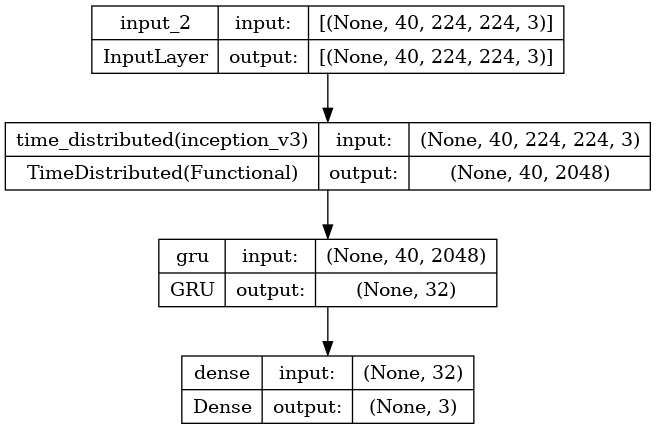

In [28]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model1_plot.png', show_shapes=True, show_layer_names=True)

In [29]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3

# Constants
num_classes = 3
num_frames_per_video = 40
image_height = 224
image_width = 224
num_channels = 3

# Load pre-trained Inception model
base_model = InceptionV3(weights='imagenet', include_top=False, pooling='max')

# Freeze the pre-trained model's layers
for layer in base_model.layers[:-1]:
    layer.trainable = False

input_shape = (num_frames_per_video, image_height, image_width, num_channels)

# Spatial Stream
spatial_input = tf.keras.Input(shape=input_shape)
spatial_features = tf.keras.layers.TimeDistributed(base_model)(spatial_input)
#spatial_reshaped = tf.keras.layers.Reshape((-1, base_model.output.shape[-1]))(spatial_features)
spatial_aggregated = tf.keras.layers.GlobalAveragePooling1D()(spatial_features)
spatial_flattened = tf.keras.layers.Flatten()(spatial_aggregated)

# Temporal Stream
temporal_input = tf.keras.Input(shape=input_shape)
x = tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten())(temporal_input)
x = tf.keras.layers.GRU(32)(x)
temporal_reshaped = tf.keras.layers.Reshape((-1, x.shape[-1]))(x)
temporal_aggregated = tf.keras.layers.GlobalAveragePooling1D()(temporal_reshaped)
temporal_flattened = tf.keras.layers.Flatten()(temporal_aggregated)

# Concatenate and classify
merged_features = tf.keras.layers.concatenate([spatial_flattened, temporal_flattened])
output = tf.keras.layers.Dense(num_classes, activation='softmax')(merged_features)


model1 = tf.keras.Model(inputs=[spatial_input, temporal_input], outputs=output)


model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 40, 224, 22  0           []                               
                                4, 3)]                                                            
                                                                                                  
 time_distributed_2 (TimeDistri  (None, 40, 150528)  0           ['input_5[0][0]']                
 buted)                                                                                           
                                                                                                  
 input_4 (InputLayer)           [(None, 40, 224, 22  0           []                               
                                4, 3)]                                                      

In [30]:
#model1.load_weights('/kaggle/input/highway-info/weights (1).hdf5')

In [31]:
X_spatial = X  # Shape: (num_samples, height, width, num_channels)
X_temporal = X.reshape(-1,4, 10, height,width, 3)  # Shape: (num_samples, num_frames, height, width, num_channels)
X_val_spatial = X_val  # Shape: (num_samples, height, width, num_channels)
X_val_temporal = X_val.reshape(-1,4, 10, height,width, 3)  # Shape: (num_samples, num_frames, height, width, num_channels)


In [32]:
model1.fit([X,X], train_labels,validation_data=([X_val,X_val], test_labels),epochs=20,batch_size=8,
           callbacks=[checkpoint,reduce_lr])

Epoch 1/20
23/23 [==============================] - 32s 835ms/step - loss: 30.6436 - accuracy: 0.5424 - val_loss: 11.2717 - val_accuracy: 0.7532 - lr: 0.0010
Epoch 2/20
23/23 [==============================] - 13s 569ms/step - loss: 6.6822 - accuracy: 0.7232 - val_loss: 7.1598 - val_accuracy: 0.7403 - lr: 0.0010
Epoch 3/20
23/23 [==============================] - 11s 491ms/step - loss: 3.4341 - accuracy: 0.8079 - val_loss: 18.0293 - val_accuracy: 0.7143 - lr: 0.0010
Epoch 4/20
23/23 [==============================] - 13s 574ms/step - loss: 5.4127 - accuracy: 0.8023 - val_loss: 8.2127 - val_accuracy: 0.7792 - lr: 0.0010
Epoch 5/20
23/23 [==============================] - 13s 579ms/step - loss: 2.5566 - accuracy: 0.8418 - val_loss: 4.8378 - val_accuracy: 0.7792 - lr: 2.0000e-04
Epoch 6/20
23/23 [==============================] - 13s 574ms/step - loss: 1.5449 - accuracy: 0.8814 - val_loss: 3.3187 - val_accuracy: 0.8442 - lr: 2.0000e-04
Epoch 7/20
23/23 [==============================] - 1

As we can see from above that, trainig a Conv3D model from scratch achieves lower accuracy than taking leverage of a pre trained model such as **InceptionV3**.

Also a two streamed **spatiotemporal**** architecture where the neural network learns both spatial and temporal features and performs classofication taking both the features into account is proven to be more effective as we can see it here. 

Now the question remains, Is using a Conv3D for the temporal architecture better? or should I use a Bi directional LSTM or GRU....


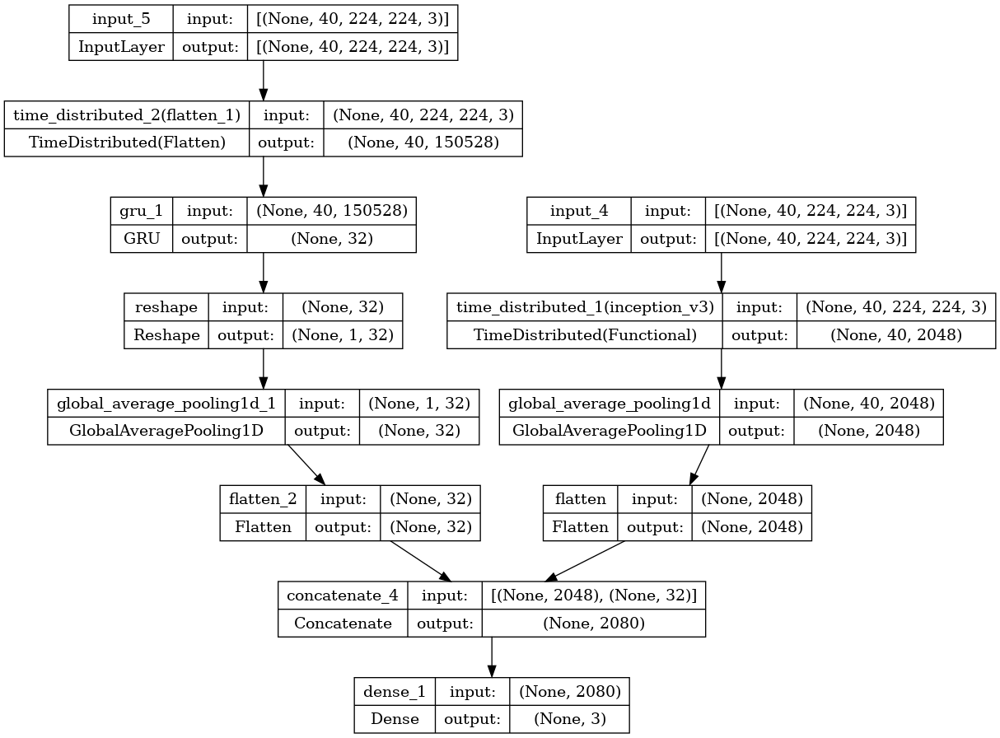

In [33]:
from keras.utils.vis_utils import plot_model
plot_model(model1, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [34]:
try:
    predicted_labels_array =  model1.predict([X_val,X_val])
except:
    print("Greater computational power is required")

# Loop through each predicted label and corresponding sequence of frames
correctly_predicted_videos_count = 0
predicted_labels_list = []
true_labels_list = []
for i in range(len(predicted_labels_array)):
    predicted_label_array = predicted_labels_array[i]
    
    # Map predicted label index to label name
    predicted_label_index = np.argmax(predicted_label_array)
    if predicted_label_index == 0:
        predicted_label_name = 'light'
    elif predicted_label_index == 1:
        predicted_label_name = 'medium'
    elif predicted_label_index == 2:
        predicted_label_name = 'heavy'

        
    # Check if predicted label matches true label
    true_label_array = test_labels[i]
    
    true_label_index = np.argmax(true_label_array)
    
    if true_label_index == 0:
        true_label_name = 'light'
    elif true_label_index == 1:
        true_label_name = 'medium'
    elif true_label_index == 2:
        true_label_name = 'heavy'

    
        
    if predicted_label_name == true_label_name:
        correctly_predicted_videos_count += 1
        
        # Create video writer object and write each frame to output video file with label in top corner
        output_file_name = 'output_video_' + str(i) + '.avi'
        output_file_path = '/kaggle/working/' + output_file_name
        fourcc = cv2.VideoWriter_fourcc(*'XVID')
        out = cv2.VideoWriter(output_file_path, fourcc, 20.0, (width,height))
        
        for j in range(num_frames):
            frame_with_label = cv2.putText(X_val[i][j], true_label_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX ,  
                   1, (255, 0, 0), 2, cv2.LINE_AA) 
            out.write(frame_with_label)
            
        out.release()
        
    # Append predicted and true labels to lists for calculating f1 score later on
    predicted_labels_list.append(predicted_label_name)
    true_labels_list.append(true_label_name)

3/3 [==============================] - 30s 5s/step


In [35]:
print(correctly_predicted_videos_count)

64


In [36]:
print(predicted_labels_list)

['light', 'light', 'light', 'medium', 'heavy', 'light', 'light', 'light', 'light', 'medium', 'light', 'light', 'light', 'medium', 'light', 'medium', 'heavy', 'light', 'light', 'light', 'light', 'heavy', 'light', 'light', 'medium', 'heavy', 'light', 'light', 'heavy', 'light', 'heavy', 'light', 'heavy', 'light', 'heavy', 'light', 'light', 'heavy', 'heavy', 'light', 'light', 'light', 'light', 'medium', 'medium', 'light', 'light', 'medium', 'light', 'light', 'light', 'heavy', 'medium', 'heavy', 'medium', 'light', 'light', 'heavy', 'light', 'heavy', 'light', 'heavy', 'medium', 'heavy', 'heavy', 'light', 'medium', 'light', 'light', 'light', 'medium', 'light', 'heavy', 'heavy', 'medium', 'light', 'light']


In [37]:
print(true_labels_list)

['light', 'light', 'light', 'medium', 'heavy', 'light', 'light', 'light', 'light', 'medium', 'light', 'light', 'light', 'medium', 'light', 'medium', 'medium', 'light', 'light', 'light', 'light', 'medium', 'light', 'light', 'medium', 'heavy', 'light', 'light', 'heavy', 'light', 'heavy', 'light', 'heavy', 'light', 'heavy', 'light', 'light', 'heavy', 'heavy', 'light', 'light', 'light', 'light', 'heavy', 'heavy', 'light', 'light', 'heavy', 'light', 'light', 'light', 'heavy', 'medium', 'heavy', 'medium', 'light', 'light', 'medium', 'light', 'medium', 'light', 'heavy', 'medium', 'medium', 'medium', 'light', 'light', 'light', 'light', 'light', 'heavy', 'light', 'medium', 'heavy', 'light', 'light', 'light']


In [38]:
from sklearn.metrics import f1_score, classification_report
import numpy as np

# Convert the predictions from probabilities to class labels
predicted_labels = np.argmax(predicted_labels_array, axis=1)

# Convert the true labels from one-hot encoding to class labels
true_labels = np.argmax(test_labels, axis=1)

# Calculate the F1 score
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Print the F1 score
print(f'F1 score: {f1:.4f}')

# Generate and print the classification report
report = classification_report(true_labels, predicted_labels)
print(report)


F1 score: 0.8341
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        46
           1       0.57      0.53      0.55        15
           2       0.63      0.75      0.69        16

    accuracy                           0.83        77
   macro avg       0.73      0.75      0.74        77
weighted avg       0.84      0.83      0.83        77



From the classification report, it is evident that our model performs relatively worse for 'medium. and 'heavy' traffic flow, this is also expected as there exist a high class imbalance in the dataset with 45 'heavy' trafic flow video, 44 'medium' traffic flow videos and 165 'light' traffic flow videos. We need to acquire more data of medium and heavy traffic flow videos


Let's see now, how our single stream model does

In [39]:
prediction = model.predict(X_val)
# Convert the predictions from probabilities to class labels
predicted_labels = np.argmax(prediction, axis=1)

# Convert the true labels from one-hot encoding to class labels
true_labels = np.argmax(test_labels, axis=1)

# Calculate the F1 score
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Print the F1 score
print(f'F1 score: {f1:.4f}')

# Generate and print the classification report
report = classification_report(true_labels, predicted_labels)
print(report)

3/3 [==============================] - 6s 592ms/step
F1 score: 0.4468
              precision    recall  f1-score   support

           0       0.60      1.00      0.75        46
           1       0.00      0.00      0.00        15
           2       0.00      0.00      0.00        16

    accuracy                           0.60        77
   macro avg       0.20      0.33      0.25        77
weighted avg       0.36      0.60      0.45        77



As We can see there is a **Significant** difference in weighted f1_score between two models, Clearly the 2 streamed model outperforms the single stream network in every context!